# Context

Testing cluster tracking for detection and separation of individual capillary pores.

# Imports

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter, uniform_filter
import pickle

In [2]:
from PIL import Image
import os
from skimage import exposure

In [3]:
import matplotlib
import matplotlib.animation
from IPython.display import HTML
matplotlib.rcParams['animation.embed_limit'] = 2**128

### Import our custom utility methods

In [4]:
import sys
%reload_ext autoreload
%autoreload 2

In [21]:
from cluster_tracking_alt import FastDensityClustering

In [22]:
tensor_raw = np.load("../../XRM/XRM_10min_imb_front_3.npy")

In [23]:
tensor_raw = np.swapaxes(tensor_raw,0,2)
tensor_raw = tensor_raw[:,:128,:128]
tensor_raw -= np.min(tensor_raw)
tensor_raw /= np.max(tensor_raw)

In [24]:
for i, img in enumerate(tensor_raw):
    #tensor_raw[i] = np.exp(tensor_raw[i])
    #tensor_raw -= np.min(tensor_raw)
    #tensor_raw /= np.max(tensor_raw)
    tensor_raw[i] = exposure.equalize_adapthist(img)
    #tensor_raw -= np.min(tensor_raw)
    #tensor_raw /= np.max(tensor_raw)

In [25]:
tensor_raw -= np.min(tensor_raw)
tensor_raw /= np.max(tensor_raw)

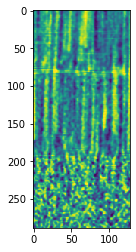

In [26]:
plt.imshow(tensor_raw[:,10,:])

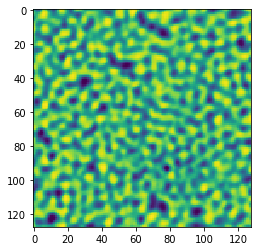

In [27]:
plt.imshow(-np.exp(tensor_raw[0]))

In [28]:
tensor = -tensor_raw.copy()
tensor -= np.min(tensor)
tensor /= np.max(tensor)
tensor[tensor<.6] = .6
#tensor[tensor>.3] = .3
tensor -= np.min(tensor)
tensor /= np.max(tensor)

#tensor += tensor_raw

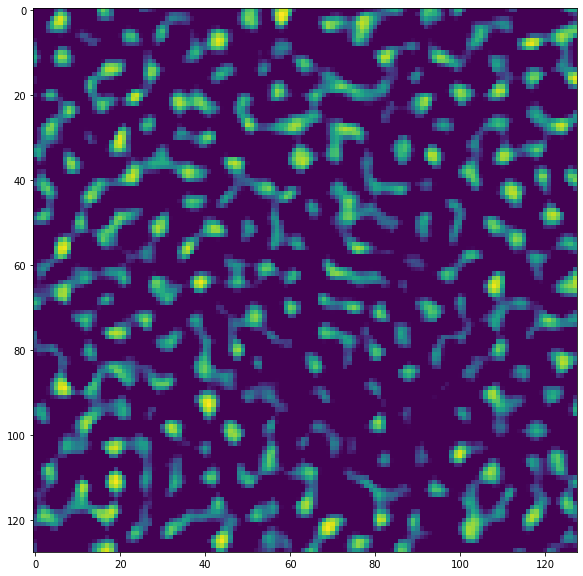

In [29]:
fig, ax = plt.subplots(1, figsize=(10,10))
ax.imshow(tensor[0])

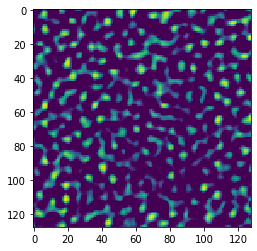

In [30]:
plt.imshow(gaussian_filter(tensor,[2,0,0])[1])

In [31]:
smooth = np.array(tensor, dtype=np.int64)

In [32]:
smooth = gaussian_filter(tensor,[2,0,0])

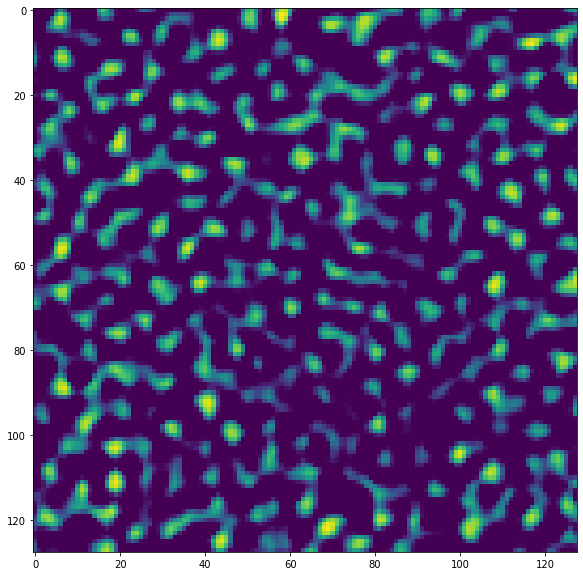

In [33]:
fig, ax = plt.subplots(1, figsize=(10,10))
ax.imshow(smooth[0])

In [34]:
labeled_tensor = FastDensityClustering.cluster_tracking(smooth, mapp=None, 
                                                        mode="closest_center", frames = 250, search_window_size=5)

.........................................................................................................................................................................................................................................................

In [ ]:
np.max(labeled_tensor)

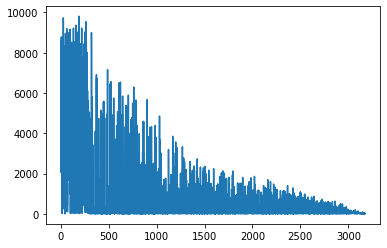

In [36]:
size_of_cluster = np.array([np.sum(labeled_tensor==i) for i in range(int(np.max(labeled_tensor)))])
plt.plot(size_of_cluster)

In [37]:
np.where(size_of_cluster>800)

(array([   0,    1,    2,    3,    4,    5,    6,    7,    8,    9,   11,
          13,   14,   15,   16,   17,   18,   19,   20,   21,   22,   23,
          25,   26,   27,   28,   29,   30,   31,   32,   33,   34,   35,
          37,   38,   40,   43,   44,   45,   46,   47,   48,   49,   51,
          52,   53,   54,   55,   59,   60,   61,   62,   63,   64,   65,
          66,   67,   69,   72,   73,   74,   75,   76,   77,   78,   79,
          80,   81,   82,   83,   84,   85,   86,   87,   88,   89,   90,
          91,   92,   93,   94,   95,   96,   97,   98,   99,  102,  103,
         104,  105,  106,  107,  108,  109,  110,  111,  113,  114,  115,
         116,  117,  118,  119,  120,  121,  122,  123,  124,  125,  127,
         128,  132,  133,  134,  135,  136,  137,  138,  139,  140,  141,
         142,  143,  144,  146,  147,  150,  151,  152,  153,  154,  155,
         156,  157,  158,  159,  160,  161,  162,  163,  164,  165,  167,
         168,  169,  170,  172,  173, 

In [40]:
%%capture
fig, ax = plt.subplots(1,3)
ax[0].axis("off")
ax[1].axis("off")
ax[2].axis("off")

sel = labeled_tensor== 0

im = ax[0].imshow(np.mean(sel, axis=0))
im1 = ax[1].imshow(np.mean(sel, axis=1))
im2 = ax[2].imshow(np.mean(sel, axis=2))


def display(i):
    print(".", end="")
    sel = labeled_tensor== i

    im.set_array(np.mean(sel, axis=0))
    im1.set_array(np.mean(sel, axis=1))
    im2.set_array(np.mean(sel, axis=2))

ani = matplotlib.animation.FuncAnimation(fig, display, frames=int(np.max(labeled_tensor))).to_jshtml()

In [42]:
HTML(ani)

In [43]:
np.sum(labeled_tensor == 0)

5333

In [ ]:
y,x = np.where(np.mean(labeled_tensor==200, axis=0))
y_min = np.min(y)
y_max = np.max(y)
x_min = np.min(x)
x_max = np.max(x)

In [ ]:
roi = labeled_tensor[:,y_min:y_max+1,x_min:x_max+1]

In [ ]:
plt.imshow(np.mean(roi[:]==200, axis=0))

In [ ]:
plt.imshow(np.median(labeled_tensor[:,:,0:5],axis=2), cmap="rainbow")

In [319]:
open("pores.html", "w").write(ani)

3054522

# 3D color coded plot

In [6]:
from plotly_voxel_plot1 import *
import random
import numpy as np

In [29]:
try:
    np.save("capillary_pores.npy", labeled_tensor)
except:
    pass
labeled_tensor = np.load("capillary_pores.npy")

In [10]:
tensor = labeled_tensor[:50,:50,:50]
tensor = np.pad(tensor,10)
labels = list(set(list(tensor.flatten())))

In [11]:
labels.sort()

In [26]:
mesh = []
for i in labels:
    if i < 1:
        continue
    color = [random.random(), random.random(), random.random()]
    mesh.extend(voxels_to_mesh(tensor == i, color = "rgb("+str(color[0])+","+str(color[1])+","+str(color[2])+")", opacity = 1))

In [27]:
fig = go.Figure(mesh)
fig = fig.update_layout(
    scene = dict(
        xaxis = dict(nticks=4, range=[0,tensor.shape[0]],),
                     yaxis = dict(nticks=4, range=[0,tensor.shape[1]],),
                     zaxis = dict(nticks=4, range=[0,tensor.shape[2]],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10))
fig.show()

In [18]:
mesh = []
for i in labels:
    opacity = 1
    if i == -1:
        color = [.5, .5, .5]
        opactity = .5
    else:
        color = [random.random(), random.random(), random.random()]
    color = "rgb("+str(color[0])+","+str(color[1])+","+str(color[2])+")"

    mesh.extend(voxels_to_mesh(tensor == i, color = color, opacity = opacity))

In [ ]:
fig = go.Figure(mesh)
fig = fig.update_layout(
    scene = dict(
        xaxis = dict(nticks=4, range=[0,tensor.shape[0]],),
                     yaxis = dict(nticks=4, range=[0,tensor.shape[1]],),
                     zaxis = dict(nticks=4, range=[0,tensor.shape[2]],),),
    width=700,
    margin=dict(r=20, l=10, b=10, t=10))
fig.show()